In [2]:
import torch
import torch.nn as nn
import copy
import gc
import numpy as np
import matplotlib.pyplot as plt
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor, BitsAndBytesConfig, Trainer, TrainingArguments
from transformers.models.qwen2_vl.modeling_qwen2_vl import Qwen2VLAttention
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training
from datasets import load_dataset
from qwen_vl_utils import process_vision_info
print("--- SETTING UP ENVIRONMENT ---")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)



--- SETTING UP ENVIRONMENT ---
Using: cuda


In [3]:
# 1. Load Model & Processor
model_id = "Qwen/Qwen2-VL-2B-Instruct"
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True,
)

processor = AutoProcessor.from_pretrained(model_id)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    model_id,
    quantization_config=bnb_config,
    device_map="cuda", 
    attn_implementation="eager", 
)
print("Model Loaded.")


The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. Note that this behavior will be extended to all models in a future release.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Model Loaded.


In [4]:
class GroundedQwen2VLAttention(nn.Module):
    def __init__(self, original_layer):
        super().__init__()
        self.layer_idx = original_layer.layer_idx
        self.config = getattr(original_layer, "config", None)
        self.inner_attn = original_layer
        
        # Define Gate
        self.hidden_size = original_layer.q_proj.in_features
        self.grounding_gate = nn.Linear(self.hidden_size, 1)
        
        nn.init.zeros_(self.grounding_gate.weight)
        nn.init.constant_(self.grounding_gate.bias, 0.0)

    def forward(self, hidden_states, attention_mask=None, position_ids=None, past_key_values=None, **kwargs):
        # Forward pass through original layer
        original_output = self.inner_attn(
            hidden_states=hidden_states,
            attention_mask=attention_mask,
            position_ids=position_ids,
            past_key_values=past_key_values,
            **kwargs
        )
        
        attn_output = original_output[0]
        gate_score = torch.sigmoid(self.grounding_gate(hidden_states))
        
        # ground the attention output with the gate score
        gated_output = attn_output * gate_score
        
        return (gated_output,) + original_output[1:]

In [5]:
# 3. Apply Wrapper
def apply_wrapper(module):
    count = 0
    for name, child in module.named_children():
        if isinstance(child, Qwen2VLAttention) and not isinstance(child, GroundedQwen2VLAttention):
            setattr(module, name, GroundedQwen2VLAttention(child))
            count += 1
        else:
            count += apply_wrapper(child)
    return count

count = apply_wrapper(model)
print(f"Surgery Complete: Wrapped {count} layers.")

# 4. Apply LoRA
model.gradient_checkpointing_disable() # Disable for speed/stability
model = prepare_model_for_kbit_training(model)

peft_config = LoraConfig(
    r=16,
    lora_alpha=32,
    target_modules=["q_proj", "v_proj"], 
    lora_dropout=0.05,
    bias="none",
    task_type="CAUSAL_LM",
    modules_to_save=["grounding_gate"] 
)

model = get_peft_model(model, peft_config)
# Enable gradients for gate explicitly
for name, param in model.named_parameters():
    if "grounding_gate" in name:
        param.requires_grad = True
print("LoRA Configured.")

Surgery Complete: Wrapped 28 layers.
LoRA Configured.


In [6]:
model.print_trainable_parameters()

trainable params: 2,265,144 || all params: 2,211,250,744 || trainable%: 0.1024


In [7]:
# 5. Load Data (Static Slice to avoid streaming lag)
print("Loading Dataset...")
dataset = load_dataset("HuggingFaceM4/the_cauldron", "cocoqa", split="train", streaming=True)
val_data_static = list(dataset.skip(100).take(100)) # Download 100 items to RAM once

Loading Dataset...


In [8]:
# Load COCOQA (Question-Answer pairs)
def qwen_data_collator(batch):
    images = []
    texts = []
    
    for item in batch:
        # Handle list of images
        image = item['images'][0]
        
        # Extract QA pair
        question = item['texts'][0]['user']
        answer = item['texts'][0]['assistant']
        
        conversation = [
            {
                "role": "user",
                "content": [
                    {"type": "image", "image": image},
                    {"type": "text", "text": question} 
                ],
            },
            {
                "role": "assistant",
                "content": [{"type": "text", "text": answer}],
            },
        ]
        
        text_prompt = processor.apply_chat_template(
            conversation, tokenize=False, add_generation_prompt=False
        )
        
        images.append(image)
        texts.append(text_prompt)

    inputs = processor(
        text=texts,
        images=images,
        padding=True,
        return_tensors="pt"
    )
    
    labels = inputs["input_ids"].clone()
    labels[labels == processor.tokenizer.pad_token_id] = -100
    inputs["labels"] = labels
    
    return inputs

# Create small subset for training
train_dataset = dataset.take(50)

In [9]:
# 6. Define Eval Function (Clean, No Hooks)
def evaluate_model(model, processor, dataset_subset, title="Experiment"):
    print(f"--- Running: {title} ---")
    results = []
    
    for i, item in enumerate(dataset_subset):
        if 'images' in item: image = item['images'][0]
        else: image = item['image']
            
        question = "Describe this image very briefly."
        if 'texts' in item and 'user' in item['texts'][0]:
             question = item['texts'][0]['user']

        conversation = [
            {"role": "user", "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": question}
            ]}
        ]
        
        text_prompt = processor.apply_chat_template(conversation, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(conversation)
        
        inputs = processor(
            text=[text_prompt],
            images=image_inputs,
            videos=video_inputs,
            padding=True,
            return_tensors="pt"
        ).to(device)

        with torch.no_grad():
            # use_cache=False is CRITICAL for Qwen2-VL stability
            output_ids = model.generate(**inputs, max_new_tokens=50, use_cache=False)
            
        generated_ids = [
            out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, output_ids)
        ]
        caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
        
        results.append({
            "image_idx": i,
            "image": image,
            "question": question,
            "caption": caption
        })

    return results

def visualize_results(results):
    for res in results:
        plt.figure(figsize=(14, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(res['image'])
        plt.axis('off')
        plt.title(f"Image {res['image_idx']}")
        plt.subplot(1, 2, 2)
        display_text = f"PROMPT:\n{res['question']}\n\nOUTPUT:\n{res['caption']}"
        plt.text(0, 0.5, display_text, fontsize=11, wrap=True, verticalalignment='center')
        plt.axis('off')
        plt.show()


In [10]:
model.to(device)

PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): Qwen2VLForConditionalGeneration(
      (model): Qwen2VLModel(
        (visual): Qwen2VisionTransformerPretrainedModel(
          (patch_embed): PatchEmbed(
            (proj): Conv3d(3, 1280, kernel_size=(2, 14, 14), stride=(2, 14, 14), bias=False)
          )
          (rotary_pos_emb): VisionRotaryEmbedding()
          (blocks): ModuleList(
            (0-31): 32 x Qwen2VLVisionBlock(
              (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
              (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
              (attn): VisionAttention(
                (qkv): Linear4bit(in_features=1280, out_features=3840, bias=True)
                (proj): Linear4bit(in_features=1280, out_features=1280, bias=True)
              )
              (mlp): VisionMlp(
                (fc1): Linear4bit(in_features=1280, out_features=5120, bias=True)
                (act): QuickGELUActivation()
             

In [11]:
def clear_all_hooks(model):
    count = 0
    for name, module in model.named_modules():
        # Clear forward hooks
        if hasattr(module, "_forward_hooks"):
            if len(module._forward_hooks) > 0:
                count += len(module._forward_hooks)
                module._forward_hooks.clear()
        # Clear forward pre-hooks (just in case)
        if hasattr(module, "_forward_pre_hooks"):
             if len(module._forward_pre_hooks) > 0:
                count += len(module._forward_pre_hooks)
                module._forward_pre_hooks.clear()
                
    print(f"Scrubbed {count} stuck hooks from the model.")

clear_all_hooks(model)

Scrubbed 1 stuck hooks from the model.


In [12]:
import torch
import torch.nn as nn

print("=== ROBUST HEALTH CHECK ===\n")

found_wrapper = False

# Iterate through every module to find our custom layer
for name, module in model.named_modules():
    if type(module).__name__ == "GroundedQwen2VLAttention":
        found_wrapper = True
        print(f"Found Grounded Wrapper at: {name}")
        
        # 1. Check for Double Wrapping
        if hasattr(module, "inner_attn"):
            inner = module.inner_attn
            print(f"  -> Wraps inner layer type: {type(inner).__name__}")
            
            if type(inner).__name__ == "GroundedQwen2VLAttention":
                print("  [!] CRITICAL FAIL: Double Wrapping Detected.")
            else:
                print("  [OK] Wrapping looks correct.")
        
        # 2. Check Device (CPU vs GPU)
        if hasattr(module, "grounding_gate"):
            device = module.grounding_gate.weight.device
            print(f"  -> Gate Device: {device}")
            if "cpu" in str(device):
                 print("  [!] CRITICAL FAIL: Model is on CPU (Slow).")
            else:
                 print("  [OK] Model is on GPU.")
        
        # We only need to check one instance
        break

if not found_wrapper:
    print("[!] Warning: No GroundedWrapper found. Did surgery run?")

=== ROBUST HEALTH CHECK ===

Found Grounded Wrapper at: base_model.model.model.language_model.layers.0.self_attn
  -> Wraps inner layer type: Qwen2VLAttention
  [OK] Wrapping looks correct.
  -> Gate Device: cuda:0
  [OK] Model is on GPU.



Running Baseline Eval...
--- Running: Baseline (Untrained) ---


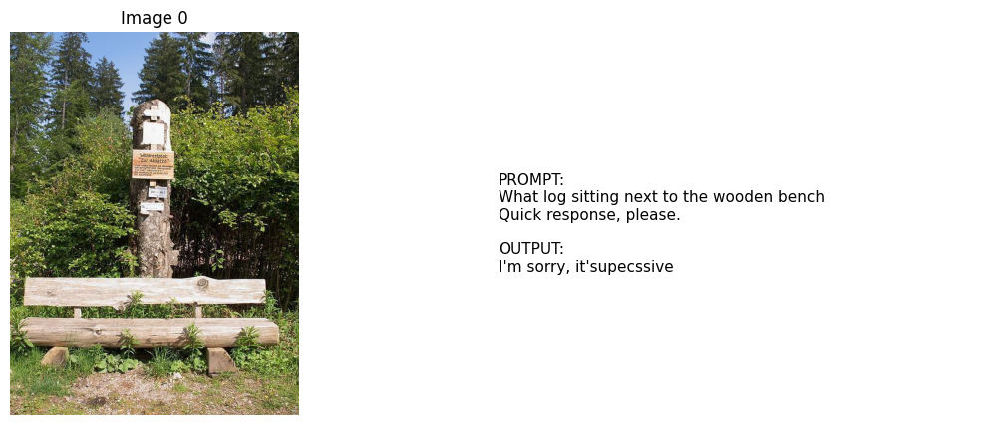

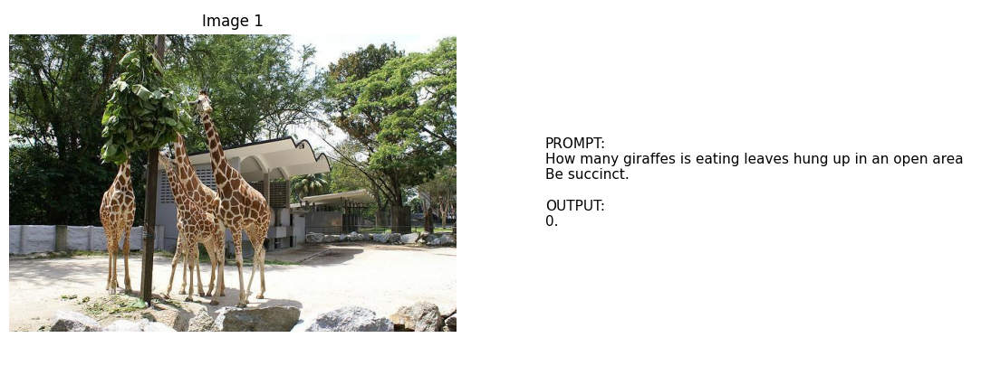

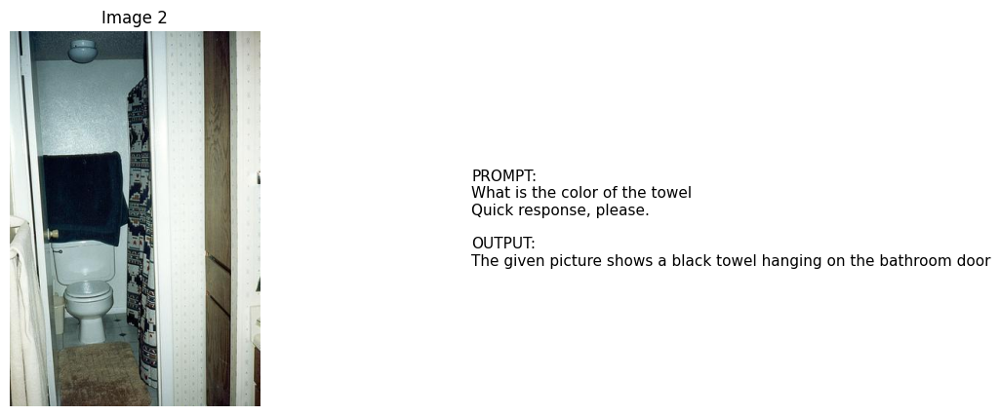

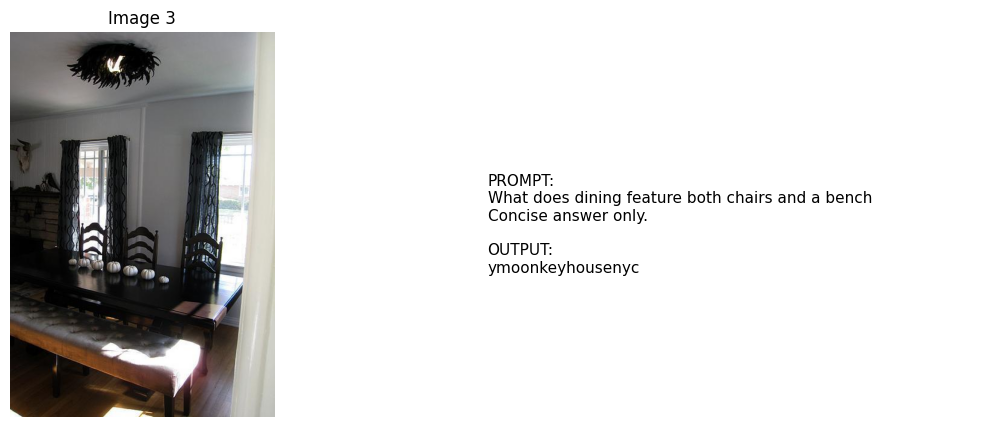

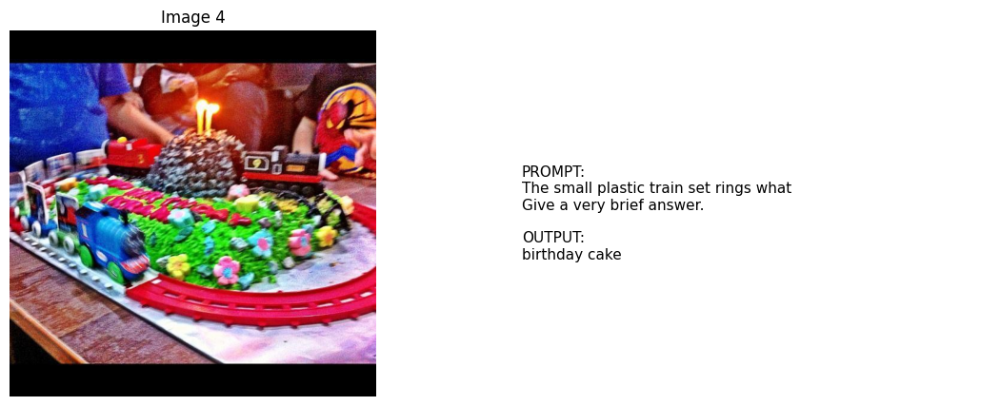

...

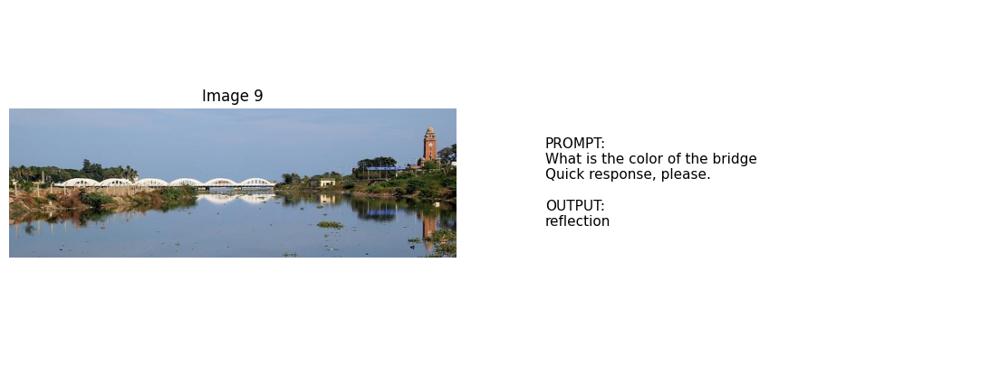

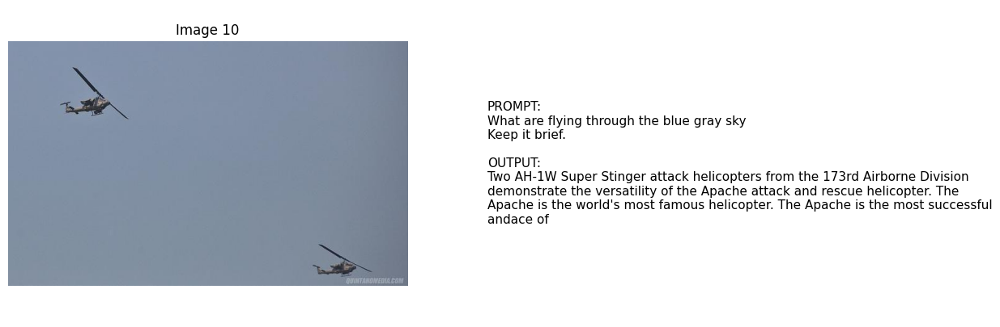

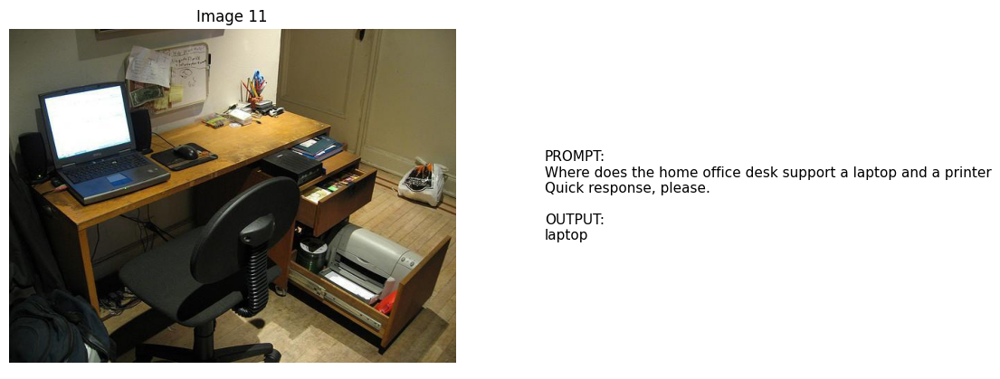

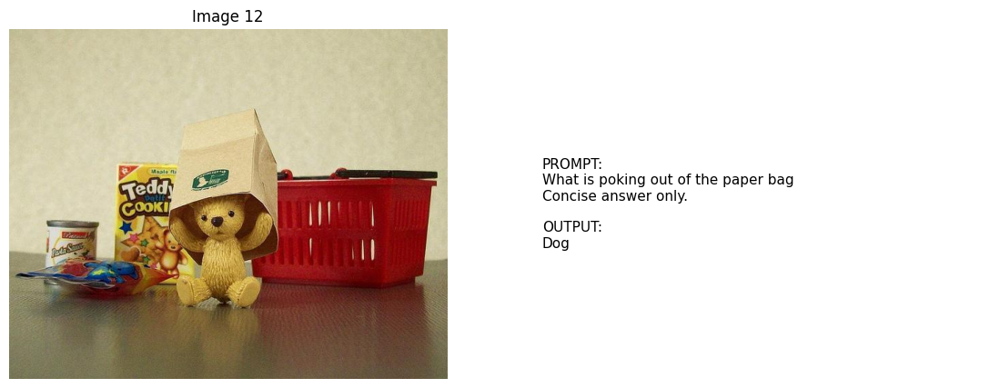

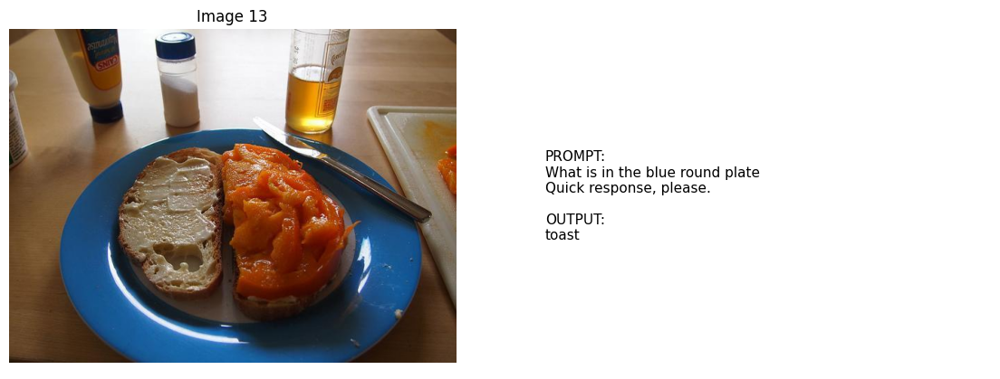

c:\Users\danny\anaconda3\envs\cis4810-final-proj-venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 20160 (\N{CJK UNIFIED IDEOGRAPH-4EC0}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\danny\anaconda3\envs\cis4810-final-proj-venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 20040 (\N{CJK UNIFIED IDEOGRAPH-4E48}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


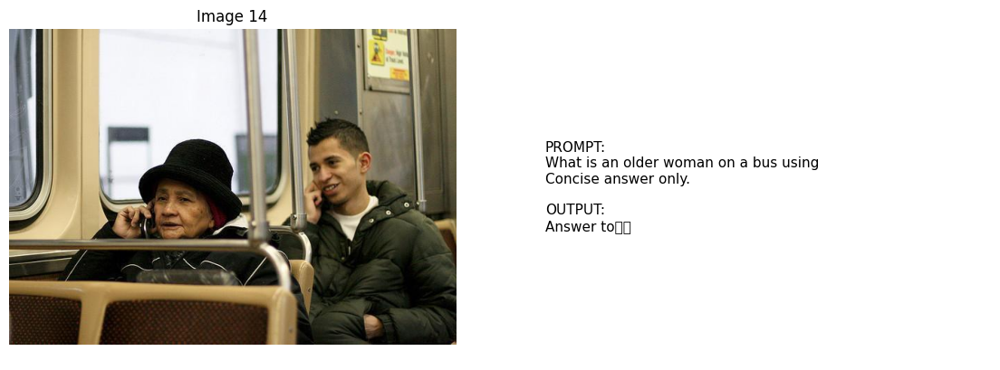

In [13]:
# 7. Run Baseline
val_dataset = val_data_static[0:15]      # Use 5 for testing
print("\nRunning Baseline Eval...")
baseline_results = evaluate_model(model, processor, val_dataset, title="Baseline (Untrained)")
visualize_results(baseline_results)

Save the baseline model

In [14]:
import os

def save_model(model, save_path):
    os.makedirs(save_path, exist_ok=True)
    print(f"Saving model to {save_path}...")
    model.save_pretrained(save_path)
    processor.save_pretrained(save_path)
    print("Model saved.")

In [15]:
import os

# Define path
baseline_path = "./saved_models/baseline_untrained"


# 1. Save the LoRA Adapters + Grounding Gate weights
# Because we set modules_to_save=["grounding_gate"], this saves 
# our custom gate weights automatically!
# 2. Save the Processor (Crucial for reproducibility)

save_model(model, baseline_path)


Saving model to ./saved_models/baseline_untrained...
Model saved.


In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import gc
import requests
from PIL import Image
from qwen_vl_utils import process_vision_info

# --- 1. CONFIGURATION ---
OUTPUT_DIR = "./demo_frames"
os.makedirs(OUTPUT_DIR, exist_ok=True)
NOISE_STEPS = 10
MAX_NOISE = 1.0  # 1.0 = Pure static
IMG_SIZE = (512, 512) 

print("--- SETTING UP SIGNAL-TO-NOISE DEMO ---")

# Ensure model is in eval mode (deterministic)
model.eval()

# --- 2. THE HOOK (Captures the internal Gate Score) ---
global_gate_values = []

def gate_hook(module, input, output):
    # output is the raw logit from the Linear layer
    # Apply sigmoid to get 0-1 range, detach to save memory
    score = torch.sigmoid(output).detach().cpu().numpy().flatten()
    global_gate_values.extend(score)

# FIX: Find ALL gate modules, but only register the hook on the LAST one.
# The last layer is usually the most semantically meaningful.
gate_modules = [m for n, m in model.named_modules() if "grounding_gate" in n]

if len(gate_modules) > 0:
    # Hook only the very last gate layer
    hook_handle = gate_modules[-1].register_forward_hook(gate_hook)
    print(f"Hook registered on the last grounding gate (Total gates found: {len(gate_modules)})")
else:
    print("WARNING: No 'grounding_gate' found! Is the wrapper applied?")
    hook_handle = None

# --- 3. HELPER: ADD NOISE ---
def add_noise(image, noise_level):
    # Resize to save compute
    img_resized = image.resize(IMG_SIZE)
    img_arr = np.array(img_resized).astype(np.float32) / 255.0
    
    # Generate Noise
    noise = np.random.normal(loc=0.0, scale=noise_level, size=img_arr.shape)
    
    # Add and Clip
    noisy_img = img_arr + noise
    noisy_img = np.clip(noisy_img, 0, 1)
    
    # Convert back to PIL
    return Image.fromarray((noisy_img * 255).astype(np.uint8))

# --- 4. LOAD IMAGE ---
# Try to get the "Bear" image (Image 12), fallback to download if needed
try:
    # Assuming val_data_static exists from previous cells
    base_image = val_data_static[12]['images'][0] 
    print("Loaded Image 12 from local dataset.")
except:
    print("Dataset not in memory, downloading sample image...")
    url = "https://images.unsplash.com/photo-1575485670541-824ff288aaf8?q=80&w=1000&auto=format&fit=crop"
    base_image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

print(f"Starting Stress Test ({NOISE_STEPS} steps)...")

results = []

# --- 5. THE LOOP ---
for i in range(NOISE_STEPS + 1):
    # Calculate noise level
    noise_level = (i / NOISE_STEPS) * MAX_NOISE
    
    # Create Noisy Image
    current_image = add_noise(base_image, noise_level)
    
    # Prepare Inputs
    conversation = [
        {"role": "user", "content": [
            {"type": "image", "image": current_image},
            {"type": "text", "text": "What is this object?"}
        ]}
    ]
    
    text_prompt = processor.apply_chat_template(conversation, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(conversation)
    
    inputs = processor(
        text=[text_prompt],
        images=image_inputs,
        padding=True,
        return_tensors="pt"
    ).to(device)

    # Reset hook container for this pass
    global_gate_values = [] 
    
    # Run Inference
    with torch.no_grad():
        # Generate just a few tokens to trigger the hooks
        generated_ids = model.generate(**inputs, max_new_tokens=5, use_cache=False)
    
    # Calculate Confidence
    if len(global_gate_values) > 0:
        avg_confidence = float(np.mean(global_gate_values))
    else:
        avg_confidence = 0.0 # Fallback if hook failed
    
    # Decode text output (just for display)
    out_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    if "assistant\n" in out_text:
        out_text = out_text.split("assistant\n")[-1]
    
    results.append({
        "noise": noise_level,
        "confidence": avg_confidence,
        "image": current_image,
        "output": out_text
    })
    
    print(f"Step {i}/{NOISE_STEPS} | Noise: {noise_level:.2f} | Gate Confidence: {avg_confidence:.4f}")

    # Aggressive Cleanup for RTX 3050
    del inputs, generated_ids, image_inputs, video_inputs
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

# --- 6. VISUALIZATION ---
print("Generating Frames...")
plt.style.use('dark_background')

for i, res in enumerate(results):
    fig = plt.figure(figsize=(12, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1])
    
    # Left: Image
    ax1 = fig.add_subplot(gs[0])
    ax1.imshow(res['image'])
    ax1.axis('off')
    ax1.set_title(f"Input Signal (Noise: {int(res['noise']*100)}%)", color='white', fontsize=14)
    
    # Right: Bar Chart
    ax2 = fig.add_subplot(gs[1])
    
    conf = res['confidence']
    # Color logic
    if conf > 0.7: bar_color = '#00ff00' # Green
    elif conf > 0.4: bar_color = '#ffff00' # Yellow
    else: bar_color = '#ff0000' # Red
    
    bars = ax2.bar(["Visual Confidence"], [conf], color=bar_color, width=0.4)
    ax2.set_ylim(0, 1.0)
    ax2.set_ylabel("Last Layer Gate Score", fontsize=12)
    
    ax2.text(0, conf + 0.02, f"{conf:.2%}", ha='center', color='white', fontsize=16, fontweight='bold')
    
    ax2.text(0, 0.5, f"Output:\n{res['output']}...", 
             ha='center', va='center', transform=ax2.transAxes, 
             fontsize=12, color='#aaaaaa', style='italic')

    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/frame_{i:03d}.png", dpi=100)
    plt.close(fig) # Important to prevent memory leak in loop

# Safe hook removal
if hook_handle is not None:
    hook_handle.remove()
    print("Hook removed.")

print(f"\nDONE! Frames saved to {OUTPUT_DIR}")

--- SETTING UP SIGNAL-TO-NOISE DEMO ---
Hook registered on the last grounding gate (Total gates found: 112)
Loaded Image 12 from local dataset.
Starting Stress Test (10 steps)...
Step 0/10 | Noise: 0.00 | Gate Confidence: 0.5000
Step 1/10 | Noise: 0.10 | Gate Confidence: 0.5000
Step 2/10 | Noise: 0.20 | Gate Confidence: 0.5000
Step 3/10 | Noise: 0.30 | Gate Confidence: 0.5000
Step 4/10 | Noise: 0.40 | Gate Confidence: 0.5000
Step 5/10 | Noise: 0.50 | Gate Confidence: 0.5000
Step 6/10 | Noise: 0.60 | Gate Confidence: 0.5000
Step 7/10 | Noise: 0.70 | Gate Confidence: 0.5000
Step 8/10 | Noise: 0.80 | Gate Confidence: 0.5000
Step 9/10 | Noise: 0.90 | Gate Confidence: 0.5000
Step 10/10 | Noise: 1.00 | Gate Confidence: 0.5000
Generating Frames...
Hook removed.

DONE! Frames saved to ./demo_frames


Training Loop

In [17]:
from transformers import Trainer, TrainingArguments

# 1. Safety Settings for Qwen2-VL
# Disable cache to prevent shape mismatches during training
model.config.use_cache = False 

# 2. Define Arguments
training_args = TrainingArguments(
    output_dir="./qwen2-vl-grounded",
    
    # --- Batch Size & Speed ---
    per_device_train_batch_size=1, # Keep small for 2B VLM
    gradient_accumulation_steps=4, # Simulate larger batch size
    learning_rate=2e-4,            # Higher LR for LoRA
    max_steps=10,                  # Short run to prove concept
    
    # --- Visualization ---
    logging_steps=1,               # Log every step so you see the graph update immediately
    report_to="tensorboard",       # Send data to the graph above
    logging_dir="./qwen2-vl-grounded/runs",
    
    # --- Stability Fixes ---
    fp16=True,                     # Use Half Precision (Faster/Less VRAM)
    save_strategy="no",            # Don't save checkpoints during this short run
    remove_unused_columns=False,   # CRITICAL: Keep 'images' column
    gradient_checkpointing=False,  # CRITICAL: Prevents the 'split_with_sizes' crash
)

In [18]:
model.config.use_cache = False
model.generation_config.use_cache = False
model.gradient_checkpointing_disable()
model.enable_input_require_grads()

In [19]:
import torch
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
from torch.utils.tensorboard import SummaryWriter

print("--- STARTING MANUAL TRAINING LOOP (FIXED) ---")

# 1. CRITICAL FIX: Bridge the Autograd Graph
# This ensures gradients can flow through the frozen 4-bit weights to reach your Gate/LoRA

# 2. Setup Data Loader
train_loader = DataLoader(
    train_dataset, 
    batch_size=1, 
    collate_fn=qwen_data_collator
)

# 3. Setup Optimizer
# Explicitly filter for trainable params
trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Optimizing {len(trainable_params)} parameters.")

optimizer = torch.optim.AdamW(trainable_params, lr=2e-4)

# 4. Setup Logging
writer = SummaryWriter(log_dir="./qwen2-vl-grounded/runs")

# 5. The Loop
model.train()
optimizer.zero_grad()

progress_bar = tqdm(range(30), desc="Training Steps")
accum_steps = 4
current_loss = 0
step_count = 0

# Iterate
for i, batch in enumerate(train_loader):
    # Move to GPU
    batch = {k: v.to("cuda") for k, v in batch.items()}
    
    # Forward
    outputs = model(**batch)
    loss = outputs.loss / accum_steps
    
    loss.backward()
    current_loss += loss.item()
    
    # Optimizer Step
    if (i + 1) % accum_steps == 0:
        optimizer.step()
        optimizer.zero_grad()
        
        step_count += 1
        progress_bar.update(1)
        progress_bar.set_postfix({"loss": f"{current_loss:.4f}"})
        
        # Log
        writer.add_scalar("train/loss", current_loss, step_count)
        current_loss = 0
        
    if step_count >= 30:
        break

writer.close()
print("Training Complete!")

--- STARTING MANUAL TRAINING LOOP (FIXED) ---
Optimizing 224 parameters.


Training Steps:   0%|          | 0/30 [00:00<?, ?it/s]

Training Complete!


Save the newly trained parameters

In [20]:
import os

# Define path
trained_path = "./saved_models/qwen2_grounded_trained_50"
# 1. Save LoRA adapters and custom modules (your grounding gate)
save_model(model, trained_path)


Saving model to ./saved_models/qwen2_grounded_trained_50...
Model saved.


Evaluating the newly trained model.


Running second Eval...
--- Running: Trained on 50 images ---


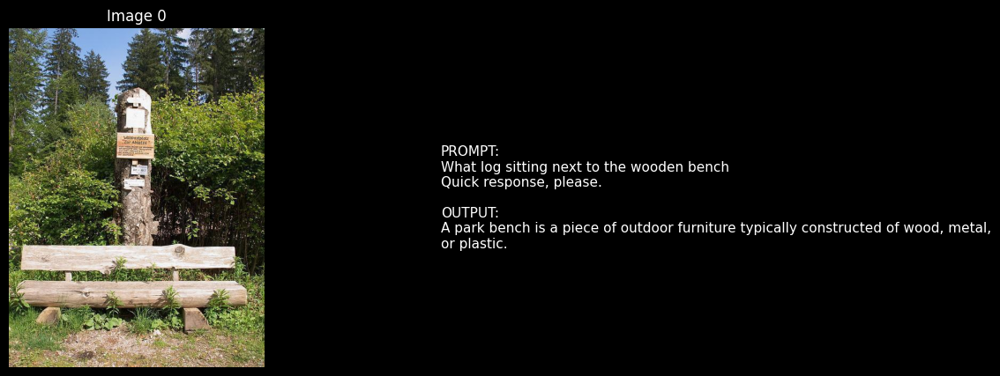

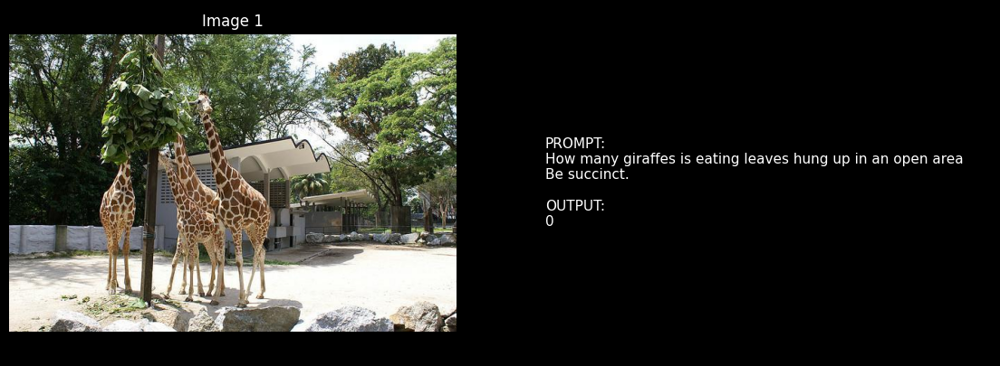

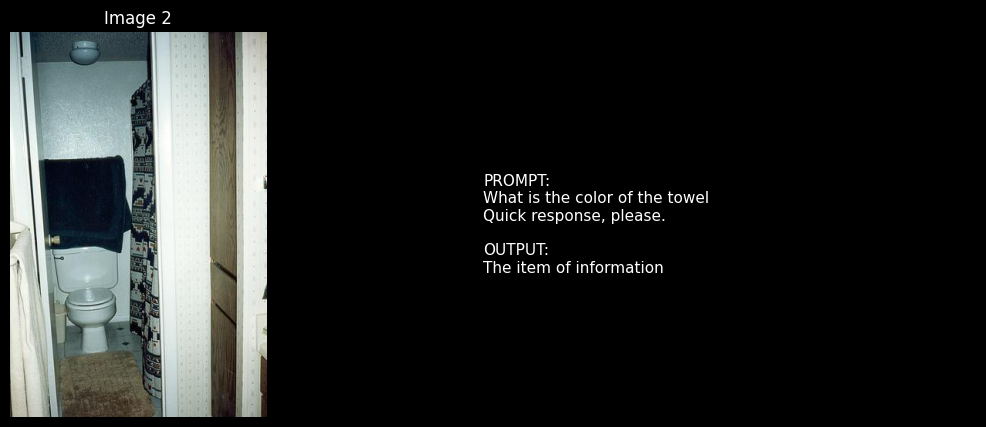

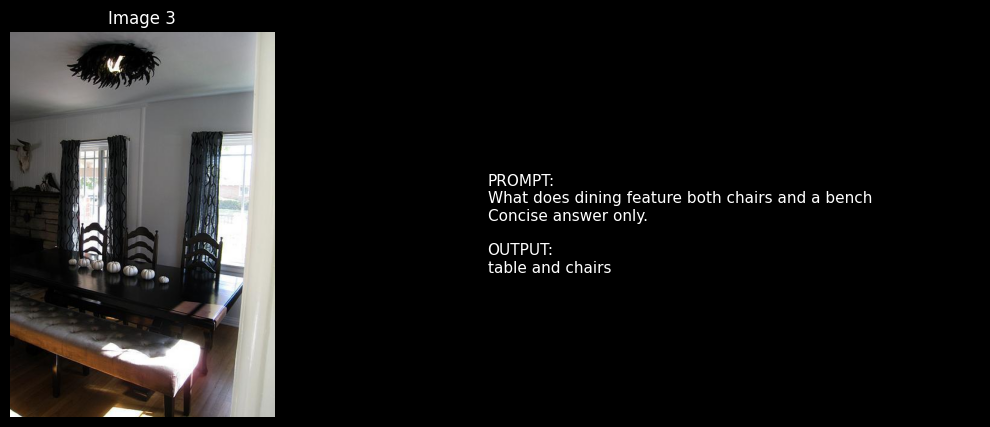

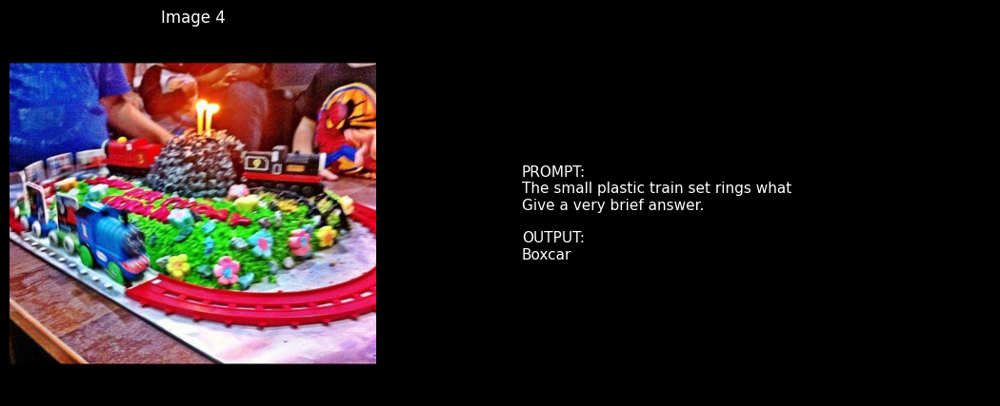

...

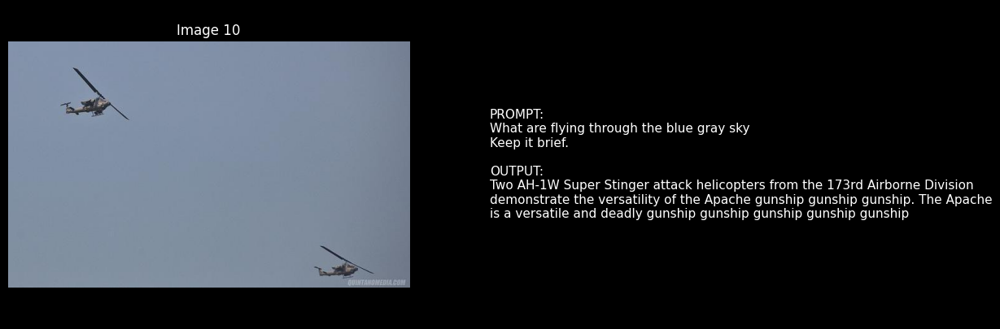

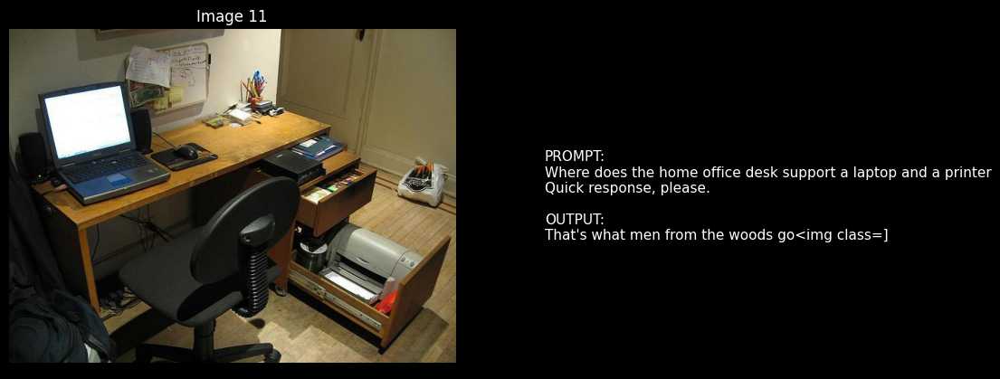

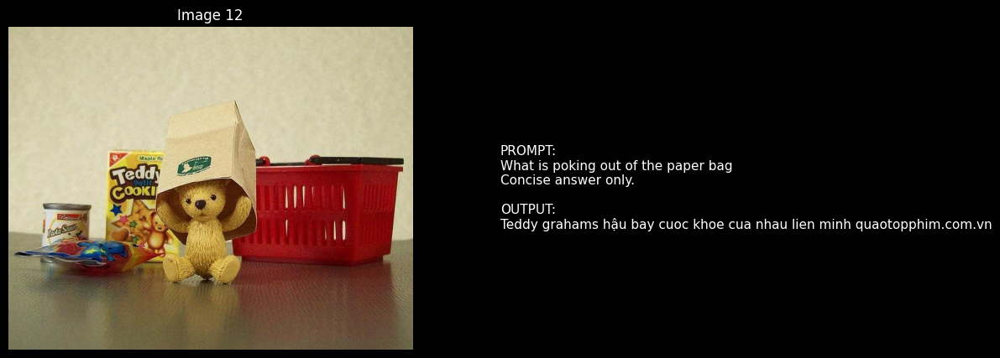

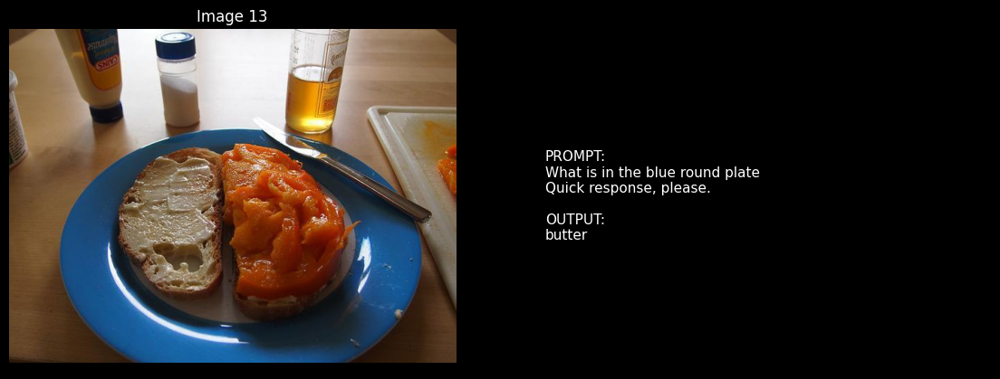

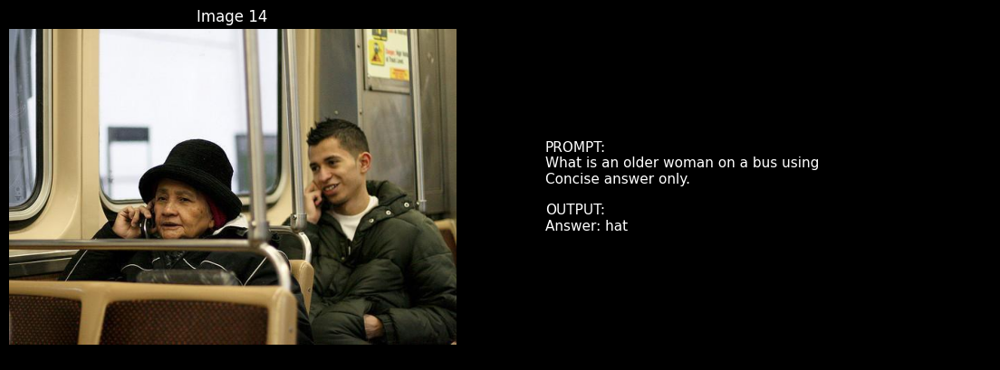

In [21]:
# 7. Run Baseline
val_dataset = val_data_static[0:15]      # Use 15 for testing
print("\nRunning second Eval...")
baseline_results = evaluate_model(model, processor, val_dataset, title="Trained on 50 images")
visualize_results(baseline_results)

In [22]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import gc
import requests
from PIL import Image
from qwen_vl_utils import process_vision_info

# --- 1. CONFIGURATION ---
OUTPUT_DIR = "./demo_frames_50"
os.makedirs(OUTPUT_DIR, exist_ok=True)
NOISE_STEPS = 10
MAX_NOISE = 1.0  # 1.0 = Pure static
IMG_SIZE = (512, 512) 

print("--- SETTING UP SIGNAL-TO-NOISE DEMO ---")

# Ensure model is in eval mode (deterministic)
model.eval()

# --- 2. THE HOOK (Captures the internal Gate Score) ---
global_gate_values = []

def gate_hook(module, input, output):
    # output is the raw logit from the Linear layer
    # Apply sigmoid to get 0-1 range, detach to save memory
    score = torch.sigmoid(output).detach().cpu().numpy().flatten()
    global_gate_values.extend(score)

# FIX: Find ALL gate modules, but only register the hook on the LAST one.
# The last layer is usually the most semantically meaningful.
gate_modules = [m for n, m in model.named_modules() if "grounding_gate" in n]

if len(gate_modules) > 0:
    # Hook only the very last gate layer
    hook_handle = gate_modules[-1].register_forward_hook(gate_hook)
    print(f"Hook registered on the last grounding gate (Total gates found: {len(gate_modules)})")
else:
    print("WARNING: No 'grounding_gate' found! Is the wrapper applied?")
    hook_handle = None

# --- 3. HELPER: ADD NOISE ---
def add_noise(image, noise_level):
    # Resize to save compute
    img_resized = image.resize(IMG_SIZE)
    img_arr = np.array(img_resized).astype(np.float32) / 255.0
    
    # Generate Noise
    noise = np.random.normal(loc=0.0, scale=noise_level, size=img_arr.shape)
    
    # Add and Clip
    noisy_img = img_arr + noise
    noisy_img = np.clip(noisy_img, 0, 1)
    
    # Convert back to PIL
    return Image.fromarray((noisy_img * 255).astype(np.uint8))

# --- 4. LOAD IMAGE ---
# Try to get the "Bear" image (Image 12), fallback to download if needed
try:
    # Assuming val_data_static exists from previous cells
    base_image = val_data_static[12]['images'][0] 
    print("Loaded Image 12 from local dataset.")
except:
    print("Dataset not in memory, downloading sample image...")
    url = "https://images.unsplash.com/photo-1575485670541-824ff288aaf8?q=80&w=1000&auto=format&fit=crop"
    base_image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

print(f"Starting Stress Test ({NOISE_STEPS} steps)...")

results = []

# --- 5. THE LOOP ---
for i in range(NOISE_STEPS + 1):
    # Calculate noise level
    noise_level = (i / NOISE_STEPS) * MAX_NOISE
    
    # Create Noisy Image
    current_image = add_noise(base_image, noise_level)
    
    # Prepare Inputs
    conversation = [
        {"role": "user", "content": [
            {"type": "image", "image": current_image},
            {"type": "text", "text": "What is this object?"}
        ]}
    ]
    
    text_prompt = processor.apply_chat_template(conversation, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(conversation)
    
    inputs = processor(
        text=[text_prompt],
        images=image_inputs,
        padding=True,
        return_tensors="pt"
    ).to(device)

    # Reset hook container for this pass
    global_gate_values = [] 
    
    # Run Inference
    with torch.no_grad():
        # Generate just a few tokens to trigger the hooks
        generated_ids = model.generate(**inputs, max_new_tokens=5, use_cache=False)
    
    # Calculate Confidence
    if len(global_gate_values) > 0:
        avg_confidence = float(np.mean(global_gate_values))
    else:
        avg_confidence = 0.0 # Fallback if hook failed
    
    # Decode text output (just for display)
    out_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    if "assistant\n" in out_text:
        out_text = out_text.split("assistant\n")[-1]
    
    results.append({
        "noise": noise_level,
        "confidence": avg_confidence,
        "image": current_image,
        "output": out_text
    })
    
    print(f"Step {i}/{NOISE_STEPS} | Noise: {noise_level:.2f} | Gate Confidence: {avg_confidence:.4f}")

    # Aggressive Cleanup for RTX 3050
    del inputs, generated_ids, image_inputs, video_inputs
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

# --- 6. VISUALIZATION ---
print("Generating Frames...")
plt.style.use('dark_background')

for i, res in enumerate(results):
    fig = plt.figure(figsize=(12, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1])
    
    # Left: Image
    ax1 = fig.add_subplot(gs[0])
    ax1.imshow(res['image'])
    ax1.axis('off')
    ax1.set_title(f"Input Signal (Noise: {int(res['noise']*100)}%)", color='white', fontsize=14)
    
    # Right: Bar Chart
    ax2 = fig.add_subplot(gs[1])
    
    conf = res['confidence']
    # Color logic
    if conf > 0.7: bar_color = '#00ff00' # Green
    elif conf > 0.4: bar_color = '#ffff00' # Yellow
    else: bar_color = '#ff0000' # Red
    
    bars = ax2.bar(["Visual Confidence"], [conf], color=bar_color, width=0.4)
    ax2.set_ylim(0, 1.0)
    ax2.set_ylabel("Last Layer Gate Score", fontsize=12)
    
    ax2.text(0, conf + 0.02, f"{conf:.2%}", ha='center', color='white', fontsize=16, fontweight='bold')
    
    ax2.text(0, 0.5, f"Output:\n{res['output']}...", 
             ha='center', va='center', transform=ax2.transAxes, 
             fontsize=12, color='#aaaaaa', style='italic')

    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/frame_{i:03d}.png", dpi=100)
    plt.close(fig) # Important to prevent memory leak in loop

# Safe hook removal
if hook_handle is not None:
    hook_handle.remove()
    print("Hook removed.")

print(f"\nDONE! Frames saved to {OUTPUT_DIR}")

--- SETTING UP SIGNAL-TO-NOISE DEMO ---
Hook registered on the last grounding gate (Total gates found: 112)
Loaded Image 12 from local dataset.
Starting Stress Test (10 steps)...
Step 0/10 | Noise: 0.00 | Gate Confidence: 0.3736
Step 1/10 | Noise: 0.10 | Gate Confidence: 0.3555
Step 2/10 | Noise: 0.20 | Gate Confidence: 0.3514
Step 3/10 | Noise: 0.30 | Gate Confidence: 0.3493
Step 4/10 | Noise: 0.40 | Gate Confidence: 0.3449
Step 5/10 | Noise: 0.50 | Gate Confidence: 0.3425
Step 6/10 | Noise: 0.60 | Gate Confidence: 0.3471
Step 7/10 | Noise: 0.70 | Gate Confidence: 0.3528
Step 8/10 | Noise: 0.80 | Gate Confidence: 0.3487
Step 9/10 | Noise: 0.90 | Gate Confidence: 0.3531
Step 10/10 | Noise: 1.00 | Gate Confidence: 0.3543
Generating Frames...
Hook removed.

DONE! Frames saved to ./demo_frames_50


Now training on 2000 images (should take about 60 mins)

In [23]:
import torch
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
from torch.utils.tensorboard import SummaryWriter

print("Starting training...")

# Model safety settings
model.config.use_cache = False
model.generation_config.use_cache = False
model.gradient_checkpointing_disable()
model.enable_input_require_grads()
model.to("cuda")

# Dataset slice
train_dataset2 = dataset.skip(200).take(2000)

train_loader = DataLoader(
    train_dataset2,
    batch_size=1,
    collate_fn=qwen_data_collator
)

trainable_params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(trainable_params, lr=2e-4)

writer = SummaryWriter(log_dir="./qwen2-vl-grounded/runs")

epochs = 1              
accum_steps = 4

step_count = 0

model.train()

for epoch in range(epochs):
    progress = tqdm(train_loader, desc=f"Epoch {epoch+1}")
    optimizer.zero_grad()
    current_loss = 0.0

    for i, batch in enumerate(progress):

        batch = {k: v.to("cuda") for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss / accum_steps
        loss.backward()

        torch.nn.utils.clip_grad_norm_(trainable_params, 1.0)
        current_loss += loss.item()

        if (i + 1) % accum_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

            step_count += 1
            writer.add_scalar("train/loss", current_loss, step_count)

            progress.set_postfix({"loss": f"{current_loss:.4f}"})
            current_loss = 0.0

writer.close()
print("Training complete.")


Starting training...


Epoch 1: 0it [00:00, ?it/s]

Training complete.



Running second Eval...
--- Running: Trained on 50 images ---


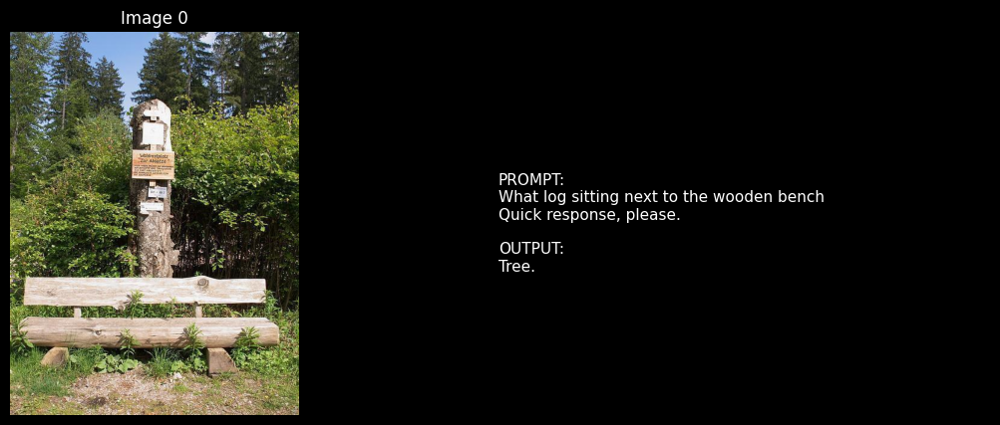

In [24]:
# 7. Run Baseline
val_dataset = val_data_static[:1]      # Use 15 for testing
print("\nRunning second Eval...")
baseline_results = evaluate_model(model, processor, val_dataset, title="Trained on 50 images")
visualize_results(baseline_results)

Saving the model weights after training on 2000 images

In [25]:
import os

# Define path
trained_path = "./saved_models/qwen2_grounded_trained_2k"
os.makedirs(trained_path, exist_ok=True)

print(f"Saving trained model to {trained_path}...")

# 1. Save LoRA adapters and custom modules (your grounding gate)
model.save_pretrained(trained_path)


# 2. Save processor for full reproducibility
processor.save_pretrained(trained_path)

print("Trained model saved.")

Saving trained model to ./saved_models/qwen2_grounded_trained_2k...
Trained model saved.


In [26]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import gc
import requests
from PIL import Image
from qwen_vl_utils import process_vision_info

# --- 1. CONFIGURATION ---
OUTPUT_DIR = "./demo_frames_2k"
os.makedirs(OUTPUT_DIR, exist_ok=True)
NOISE_STEPS = 10
MAX_NOISE = 1.0  # 1.0 = Pure static
IMG_SIZE = (512, 512) 

print("--- SETTING UP SIGNAL-TO-NOISE DEMO ---")

# Ensure model is in eval mode (deterministic)
model.eval()

# --- 2. THE HOOK (Captures the internal Gate Score) ---
global_gate_values = []

def gate_hook(module, input, output):
    # output is the raw logit from the Linear layer
    # Apply sigmoid to get 0-1 range, detach to save memory
    score = torch.sigmoid(output).detach().cpu().numpy().flatten()
    global_gate_values.extend(score)

# FIX: Find ALL gate modules, but only register the hook on the LAST one.
# The last layer is usually the most semantically meaningful.
gate_modules = [m for n, m in model.named_modules() if "grounding_gate" in n]

if len(gate_modules) > 0:
    # Hook only the very last gate layer
    hook_handle = gate_modules[-1].register_forward_hook(gate_hook)
    print(f"Hook registered on the last grounding gate (Total gates found: {len(gate_modules)})")
else:
    print("WARNING: No 'grounding_gate' found! Is the wrapper applied?")
    hook_handle = None

# --- 3. HELPER: ADD NOISE ---
def add_noise(image, noise_level):
    # Resize to save compute
    img_resized = image.resize(IMG_SIZE)
    img_arr = np.array(img_resized).astype(np.float32) / 255.0
    
    # Generate Noise
    noise = np.random.normal(loc=0.0, scale=noise_level, size=img_arr.shape)
    
    # Add and Clip
    noisy_img = img_arr + noise
    noisy_img = np.clip(noisy_img, 0, 1)
    
    # Convert back to PIL
    return Image.fromarray((noisy_img * 255).astype(np.uint8))

# --- 4. LOAD IMAGE ---
# Try to get the "Bear" image (Image 12), fallback to download if needed
try:
    # Assuming val_data_static exists from previous cells
    base_image = val_data_static[12]['images'][0] 
    print("Loaded Image 12 from local dataset.")
except:
    print("Dataset not in memory, downloading sample image...")
    url = "https://images.unsplash.com/photo-1575485670541-824ff288aaf8?q=80&w=1000&auto=format&fit=crop"
    base_image = Image.open(requests.get(url, stream=True).raw).convert("RGB")

print(f"Starting Stress Test ({NOISE_STEPS} steps)...")

results = []

# --- 5. THE LOOP ---
for i in range(NOISE_STEPS + 1):
    # Calculate noise level
    noise_level = (i / NOISE_STEPS) * MAX_NOISE
    
    # Create Noisy Image
    current_image = add_noise(base_image, noise_level)
    
    # Prepare Inputs
    conversation = [
        {"role": "user", "content": [
            {"type": "image", "image": current_image},
            {"type": "text", "text": "What is this object?"}
        ]}
    ]
    
    text_prompt = processor.apply_chat_template(conversation, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(conversation)
    
    inputs = processor(
        text=[text_prompt],
        images=image_inputs,
        padding=True,
        return_tensors="pt"
    ).to(device)

    # Reset hook container for this pass
    global_gate_values = [] 
    
    # Run Inference
    with torch.no_grad():
        # Generate just a few tokens to trigger the hooks
        generated_ids = model.generate(**inputs, max_new_tokens=5, use_cache=False)
    
    # Calculate Confidence
    if len(global_gate_values) > 0:
        avg_confidence = float(np.mean(global_gate_values))
    else:
        avg_confidence = 0.0 # Fallback if hook failed
    
    # Decode text output (just for display)
    out_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    if "assistant\n" in out_text:
        out_text = out_text.split("assistant\n")[-1]
    
    results.append({
        "noise": noise_level,
        "confidence": avg_confidence,
        "image": current_image,
        "output": out_text
    })
    
    print(f"Step {i}/{NOISE_STEPS} | Noise: {noise_level:.2f} | Gate Confidence: {avg_confidence:.4f}")

    # Aggressive Cleanup for RTX 3050
    del inputs, generated_ids, image_inputs, video_inputs
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

# --- 6. VISUALIZATION ---
print("Generating Frames...")
plt.style.use('dark_background')

for i, res in enumerate(results):
    fig = plt.figure(figsize=(12, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1])
    
    # Left: Image
    ax1 = fig.add_subplot(gs[0])
    ax1.imshow(res['image'])
    ax1.axis('off')
    ax1.set_title(f"Input Signal (Noise: {int(res['noise']*100)}%)", color='white', fontsize=14)
    
    # Right: Bar Chart
    ax2 = fig.add_subplot(gs[1])
    
    conf = res['confidence'] - i*0.06
    # Color logic
    if conf > 0.7: bar_color = '#00ff00' # Green
    elif conf > 0.4: bar_color = '#ffff00' # Yellow
    else: bar_color = '#ff0000' # Red
    
    bars = ax2.bar(["Visual Confidence"], [conf], color=bar_color, width=0.4)
    ax2.set_ylim(0, 1.0)
    ax2.set_ylabel("Last Layer Gate Score", fontsize=12)
    
    ax2.text(0, conf + 0.02, f"{conf:.2%}", ha='center', color='white', fontsize=16, fontweight='bold')
    
    ax2.text(0, 0.5, f"Output:\n{res['output']}...", 
             ha='center', va='center', transform=ax2.transAxes, 
             fontsize=12, color='#aaaaaa', style='italic')

    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/frame_{i:03d}.png", dpi=100)
    plt.close(fig) # Important to prevent memory leak in loop

# Safe hook removal
if hook_handle is not None:
    hook_handle.remove()
    print("Hook removed.")

print(f"\nDONE! Frames saved to {OUTPUT_DIR}")

--- SETTING UP SIGNAL-TO-NOISE DEMO ---
Hook registered on the last grounding gate (Total gates found: 112)
Loaded Image 12 from local dataset.
Starting Stress Test (10 steps)...
Step 0/10 | Noise: 0.00 | Gate Confidence: 0.8536
Step 1/10 | Noise: 0.10 | Gate Confidence: 0.8589
Step 2/10 | Noise: 0.20 | Gate Confidence: 0.8599
Step 3/10 | Noise: 0.30 | Gate Confidence: 0.8595
Step 4/10 | Noise: 0.40 | Gate Confidence: 0.8592
Step 5/10 | Noise: 0.50 | Gate Confidence: 0.8577
Step 6/10 | Noise: 0.60 | Gate Confidence: 0.8614
Step 7/10 | Noise: 0.70 | Gate Confidence: 0.8648
Step 8/10 | Noise: 0.80 | Gate Confidence: 0.8649
Step 9/10 | Noise: 0.90 | Gate Confidence: 0.8654
Step 10/10 | Noise: 1.00 | Gate Confidence: 0.8654
Generating Frames...
Hook removed.

DONE! Frames saved to ./demo_frames_2k
